В этом домашнем задании вы обучите GAN генерировать лица людей и посмотрите на то, как можно оценивать качество генерации

In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import torch
import torch.nn as nn
import cv2
from tqdm.notebook import tqdm
from torchvision.utils import save_image
from torchvision.utils import make_grid
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import clear_output
import seaborn as sns
%matplotlib inline

sns.set(style='darkgrid', font_scale=1.2)

## Часть 1. Подготовка данных (1 балл)

В качестве обучающей выборки возьмем часть датасета [Flickr Faces](https://github.com/NVlabs/ffhq-dataset), который содержит изображения лиц людей в высоком разрешении (1024х1024). Оригинальный датасет очень большой, поэтому мы возьмем его часть. Скачать датасет можно [здесь](https://drive.google.com/file/d/1KWPc4Pa7u2TWekUvNu9rTSO0U2eOlZA9/view?usp=sharing)

Давайте загрузим наши изображения. Напишите функцию, которая строит DataLoader для изображений, при этом меняя их размер до нужного значения (размер 1024 слишком большой, поэтому мы рекомендуем взять размер 128 либо немного больше)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/')

!ls -l /content/gdrive/MyDrive/thumbnails

Mounted at /content/gdrive/
total 2064287
-rw------- 1 root root 2113829047 Dec 16 11:50 thumbnails128x128.zip


In [ ]:
!unzip -q /content/gdrive/MyDrive/thumbnails/thumbnails128x128.zip

In [ ]:
from pathlib import Path
DATA_DIR = Path('./thumbnails')
IMAGE_SIZE = 128
BATCH_SIZE = 16

In [ ]:
def get_dataloader(image_size, batch_size):
    """
    Builds dataloader for training data.
    Use tt.Compose and tt.Resize for transformations
    :param image_size: height and wdith of the image
    :param batch_size: batch_size of the dataloader
    :returns: DataLoader object 
    """
    # TODO: resize images, convert them to tensors and build dataloader
    train_ds = ImageFolder(DATA_DIR, transform=tt.Compose([
        tt.Resize(image_size),
        tt.CenterCrop(image_size),
        tt.RandomHorizontalFlip(),
        tt.ToTensor()]))
    train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
    return train_dl

In [ ]:
train_dl = get_dataloader(IMAGE_SIZE, BATCH_SIZE)

DEVICE = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
DEVICE

device(type='cuda')

In [ ]:
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
train_dl = DeviceDataLoader(train_dl, DEVICE)

In [ ]:
def show_images(images, nmax=4):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(images.detach().cpu()[:nmax], nrow=2).permute(1, 2, 0))

def show_batch(dl, nmax=4):
    for images, _ in dl:
        show_images(images, nmax)
        break

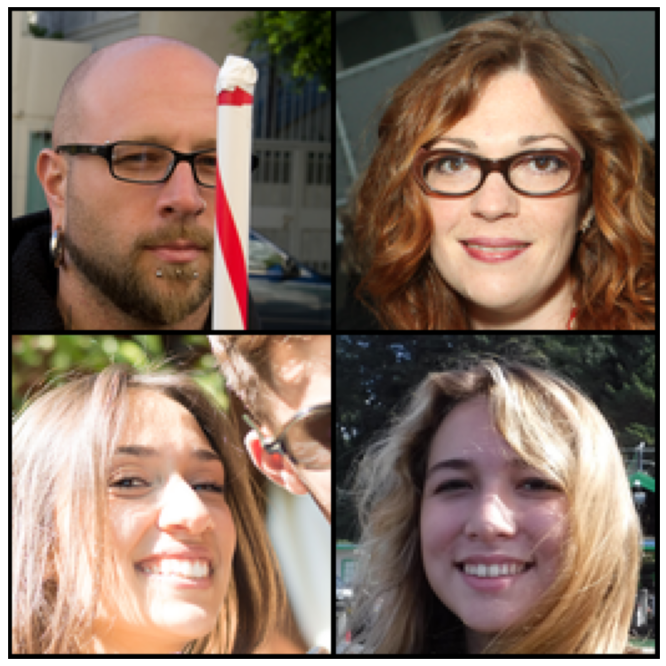

In [ ]:
show_batch(train_dl)

## Часть 2. Построение и обучение модели (2 балла)

In [ ]:
def show_generated():
    xb = torch.randn(BATCH_SIZE, latent_size, 1, 1).to(DEVICE)
    fake_images = model['generator'](xb)
    show_images(fake_images)

In [ ]:
def fit(model, criterion, epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    model['discriminator'].train()
    model['generator'].train()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    optimizer = {
        "discriminator": torch.optim.Adam(model["discriminator"].parameters(), 
                                          lr=lr, betas=(0.5, 0.999)),
        "generator": torch.optim.Adam(model["generator"].parameters(),
                                      lr=lr, betas=(0.5, 0.999))
    }
    
    for epoch in range(epochs):
        loss_d_per_epoch = []
        loss_g_per_epoch = []
        real_score_per_epoch = []
        fake_score_per_epoch = []
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            # Clear discriminator gradients
            optimizer["discriminator"].zero_grad()

            # Pass real images through discriminator
            real_preds = model["discriminator"](real_images)
            real_targets = torch.ones(real_images.size(0), 1, device=DEVICE)
            real_loss = criterion["discriminator"](real_preds, real_targets)
            cur_real_score = torch.mean(real_preds).item()
            
            # Generate fake images
            latent = torch.randn(BATCH_SIZE, latent_size, 1, 1, device=DEVICE)
            fake_images = model["generator"](latent)

            # Pass fake images through discriminator
            fake_targets = torch.zeros(fake_images.size(0), 1, device=DEVICE)
            fake_preds = model["discriminator"](fake_images)
            fake_loss = criterion["discriminator"](fake_preds, fake_targets)
            cur_fake_score = torch.mean(fake_preds).item()

            real_score_per_epoch.append(cur_real_score)
            fake_score_per_epoch.append(cur_fake_score)

            # Update discriminator weights
            loss_d = real_loss + fake_loss
            loss_d.backward()
            optimizer["discriminator"].step()
            loss_d_per_epoch.append(loss_d.item())


            # Train generator
            # Clear generator gradients
            optimizer["generator"].zero_grad()
            
            # Generate fake images
            latent = torch.randn(BATCH_SIZE, latent_size, 1, 1, device=DEVICE)
            fake_images = model["generator"](latent)
            
            # Try to fool the discriminator
            preds = model["discriminator"](fake_images)

            targets = torch.ones(BATCH_SIZE, 1, device=DEVICE)
            loss_g = criterion["generator"](preds, targets)
            
            # Update generator weights
            loss_g.backward()
            optimizer["generator"].step()
            loss_g_per_epoch.append(loss_g.item())
            
        # Record losses & scores
        losses_g.append(np.mean(loss_g_per_epoch))
        losses_d.append(np.mean(loss_d_per_epoch))
        real_scores.append(np.mean(real_score_per_epoch))
        fake_scores.append(np.mean(fake_score_per_epoch))

        # Show generated images
        model['generator'].eval()
        with torch.no_grad():
            show_generated()
            plt.show()
        model['generator'].train() 

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, 
            losses_g[-1], losses_d[-1], real_scores[-1], fake_scores[-1]))
        
    
    
    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
def weights_init(m):
    """
    This function initializes the model weights randomly from a 
    Normal distribution. This follows the specification from the DCGAN paper.
    https://arxiv.org/pdf/1511.06434.pdf
    Source: https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html
    """
    classname = m.__class__.__name__
    if classname.find('conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('instancenorm') != -1:      
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## DCGAN

Перейдем теперь к обучению нашего GANа. Алгоритм обучения следующий:
1. Учим дискриминатор:
  * берем реальные изображения и присваиваем им метку 1
  * генерируем изображения генератором и присваиваем им метку 0
  * обучаем классификатор на два класса

2. Учим генератор:
  * генерируем изображения генератором и присваиваем им метку 0
  * предсказываем дискриминаторором, реальное это изображение или нет


В качестве функции потерь я решил использовать BCE с логитами, совмещающей в себе сигмоиду и BCE(как утверждается в документации pytorch, такой лосс численно стабильнее). Поэтому на выходе дискриминаторе слой с сигмоидой отсутствует.

Кроме того, опытным путем я заметил, что PixelNorm в генераторе дает лучший визуальный результат, чем BatchNorm и InstanceNorm.

In [ ]:
class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8
        
    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        self.model = nn.Sequential(
            # in: latent_size x 1 x 1

            nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            PixelNorm(),
            nn.SiLU(inplace=True),
            # out: 512 x 4 x 4

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            PixelNorm(),
            nn.SiLU(inplace=True),
            # out: 256 x 8 x 8

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            PixelNorm(),
            nn.SiLU(inplace=True),
            # out: 128 x 16 x 16

            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            PixelNorm(),
            nn.SiLU(inplace=True),
            # out: 64 x 32 x 32

            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1, bias=False),
            PixelNorm(),
            nn.SiLU(inplace=True),
            # out: 32 x 64 x 64

            nn.ConvTranspose2d(32, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Sigmoid()
            # out: 3 x 128 x 128
        )
    def forward(self, x):
        x = self.model(x)
        return x

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(
            # in: 3 x 128 x 128

            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 64 x 64 x 64

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 128 x 32 x 32

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 256 x 16 x 16

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 512 x 8 x 8

            nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1, bias=False),
            nn.InstanceNorm2d(1024),
            nn.LeakyReLU(0.2, inplace=True),
            # out: 1024 x 4 x 4

            nn.Conv2d(1024, 1, kernel_size=4, stride=1, padding=0, bias=False),
            # out: 1 x 1 x 1

            nn.Flatten()
            )

    def forward(self, x):
        x =  self.model(x)
        return x

In [ ]:
lr = 0.0002
epochs = 10
latent_size = 100

discriminator = Discriminator()
generator = Generator()
discriminator.apply(weights_init)
generator.apply(weights_init)
model = {
    "discriminator": discriminator.to(DEVICE),
    "generator": generator.to(DEVICE)
}

criterion = {
    "discriminator": nn.BCEWithLogitsLoss(),
    "generator": nn.BCEWithLogitsLoss()
}

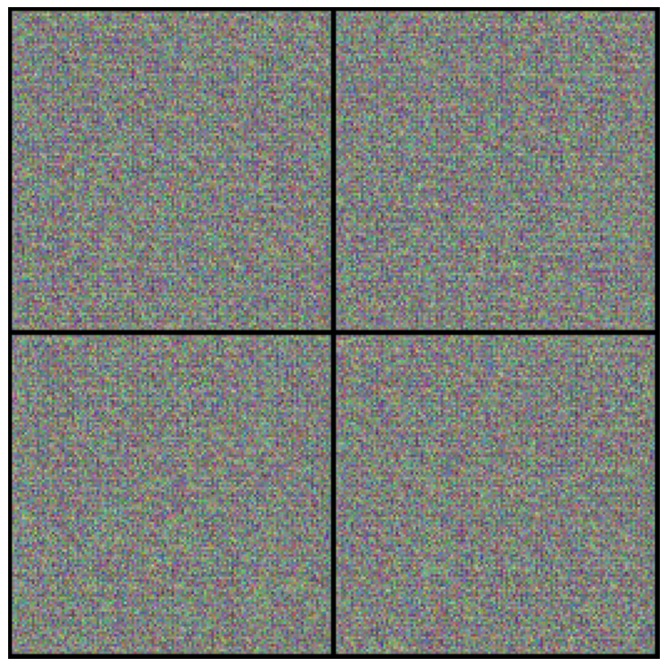

In [ ]:
show_generated()

  0%|          | 0/4375 [00:00<?, ?it/s]

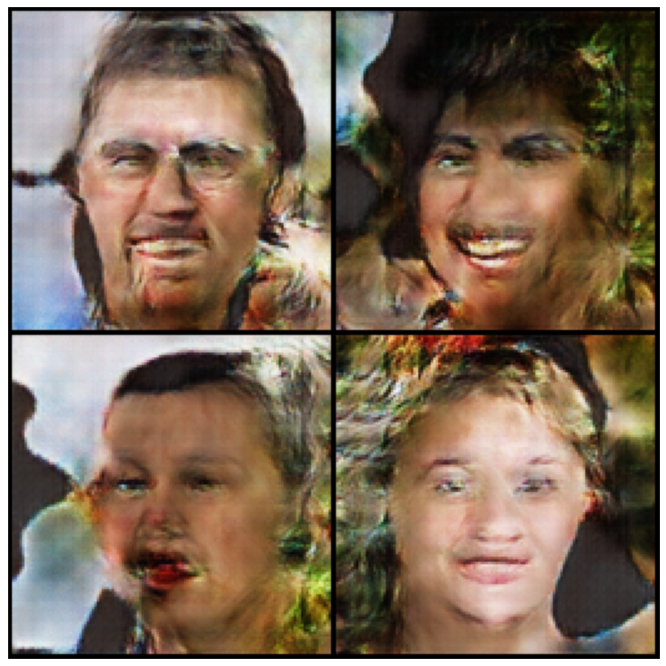

Epoch [1/10], loss_g: 4.4197, loss_d: 0.6359, real_score: 3.1773, fake_score: -2.7067


  0%|          | 0/4375 [00:00<?, ?it/s]

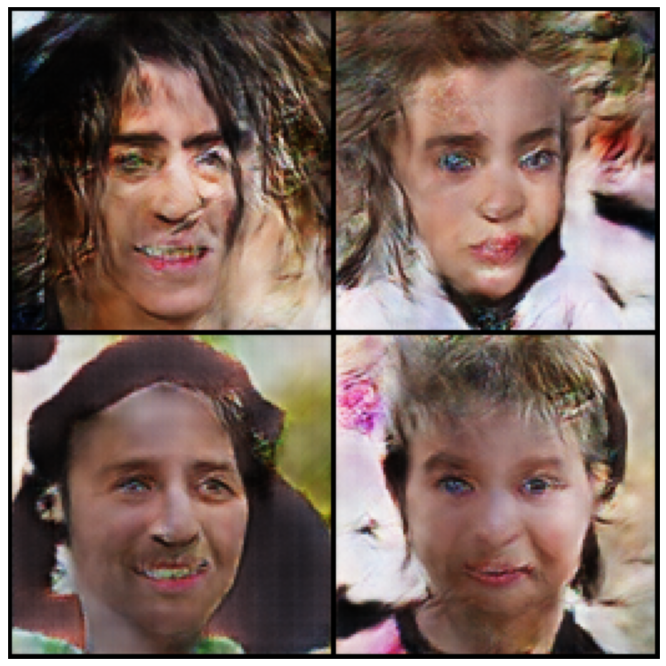

Epoch [2/10], loss_g: 4.0579, loss_d: 0.5129, real_score: 4.0347, fake_score: -2.9220


  0%|          | 0/4375 [00:00<?, ?it/s]

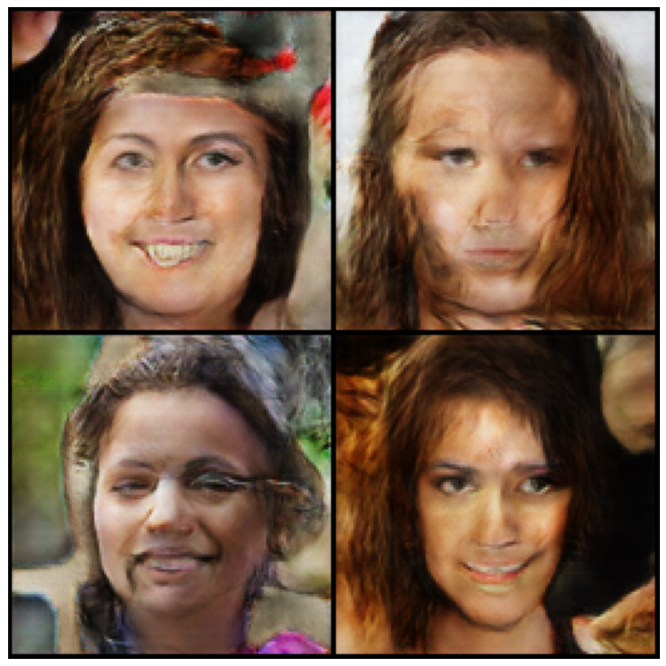

Epoch [3/10], loss_g: 4.4056, loss_d: 0.4203, real_score: 5.1114, fake_score: -3.4617


  0%|          | 0/4375 [00:00<?, ?it/s]

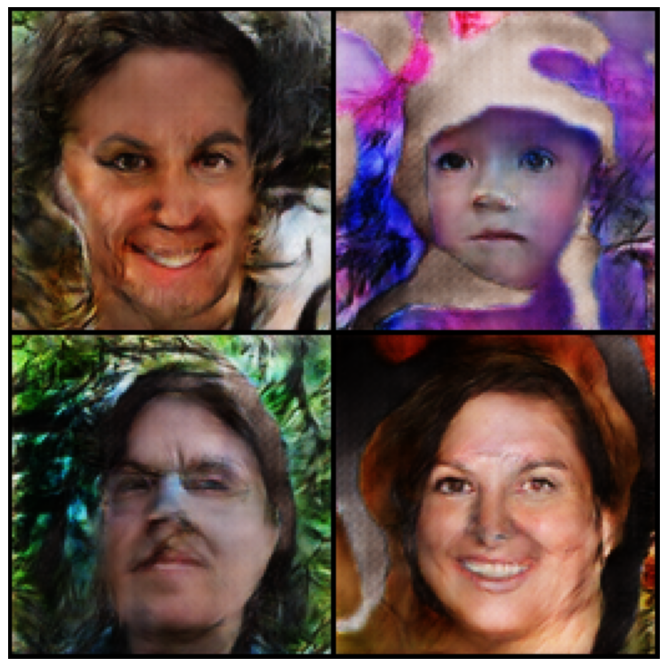

Epoch [4/10], loss_g: 4.7470, loss_d: 0.3567, real_score: 6.1015, fake_score: -3.8903


  0%|          | 0/4375 [00:00<?, ?it/s]

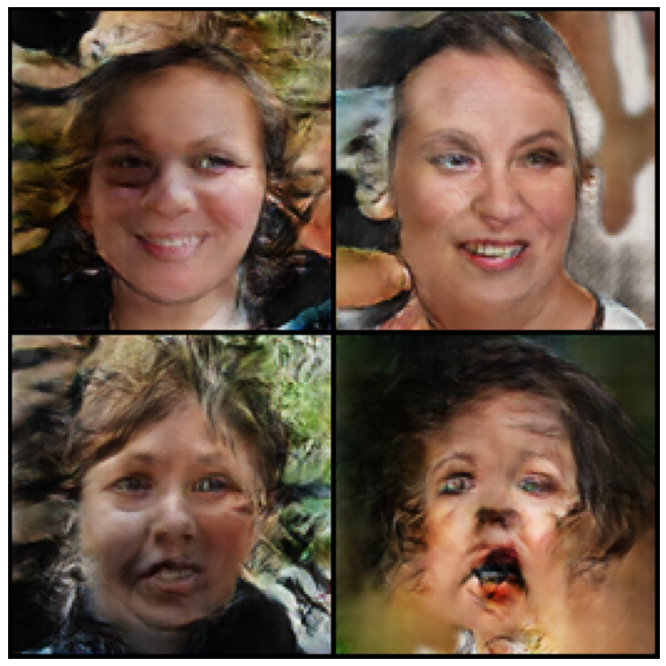

Epoch [5/10], loss_g: 4.9175, loss_d: 0.3280, real_score: 6.5780, fake_score: -4.1121


  0%|          | 0/4375 [00:00<?, ?it/s]

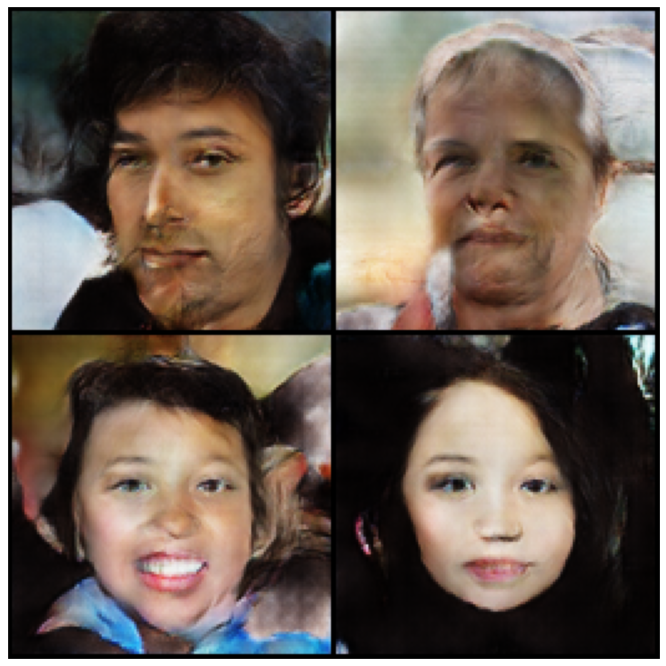

Epoch [6/10], loss_g: 5.2293, loss_d: 0.2889, real_score: 7.3992, fake_score: -4.4591


  0%|          | 0/4375 [00:00<?, ?it/s]

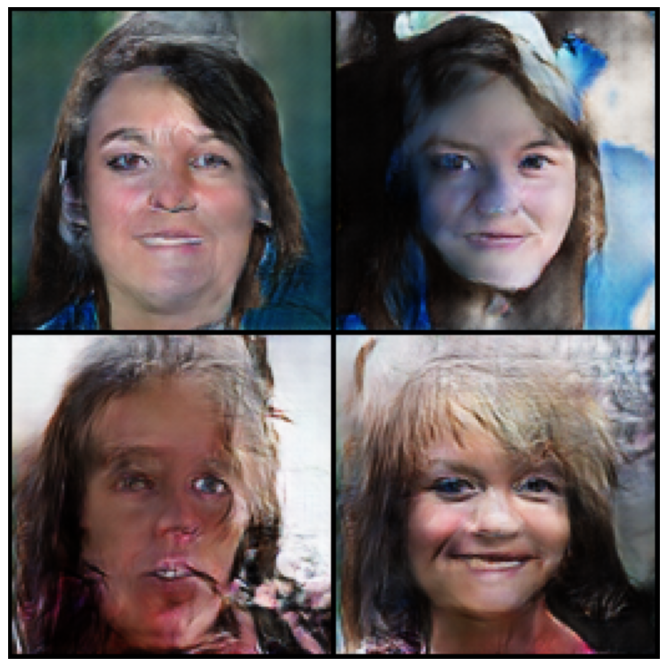

Epoch [7/10], loss_g: 5.4347, loss_d: 0.2643, real_score: 7.9516, fake_score: -4.7049


  0%|          | 0/4375 [00:00<?, ?it/s]

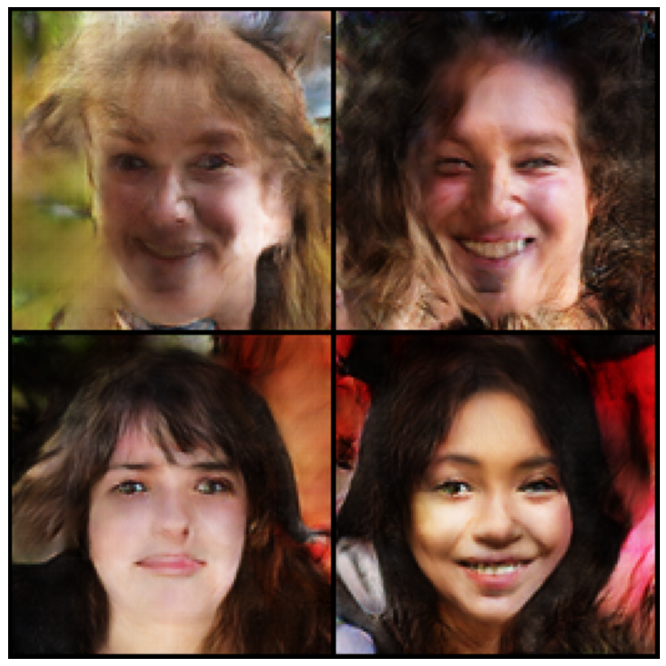

Epoch [8/10], loss_g: 5.5119, loss_d: 0.2585, real_score: 8.2226, fake_score: -4.8000


  0%|          | 0/4375 [00:00<?, ?it/s]

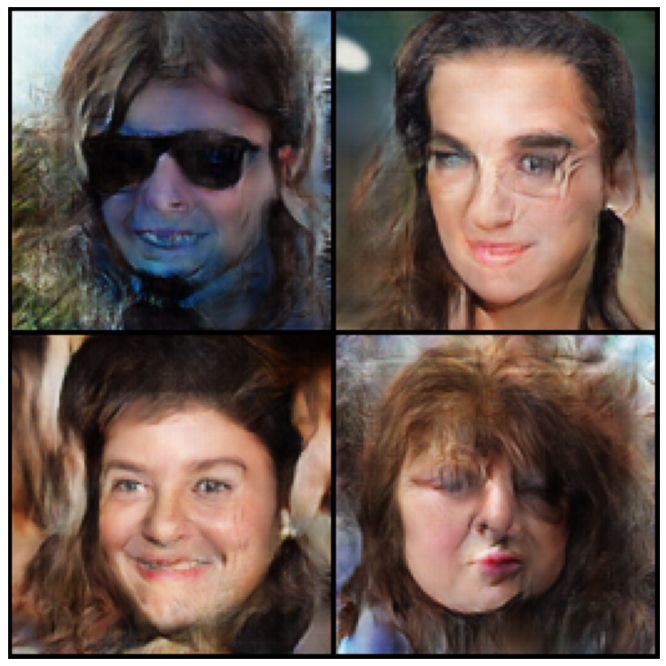

Epoch [9/10], loss_g: 5.8505, loss_d: 0.2373, real_score: 8.8428, fake_score: -5.1107


  0%|          | 0/4375 [00:00<?, ?it/s]

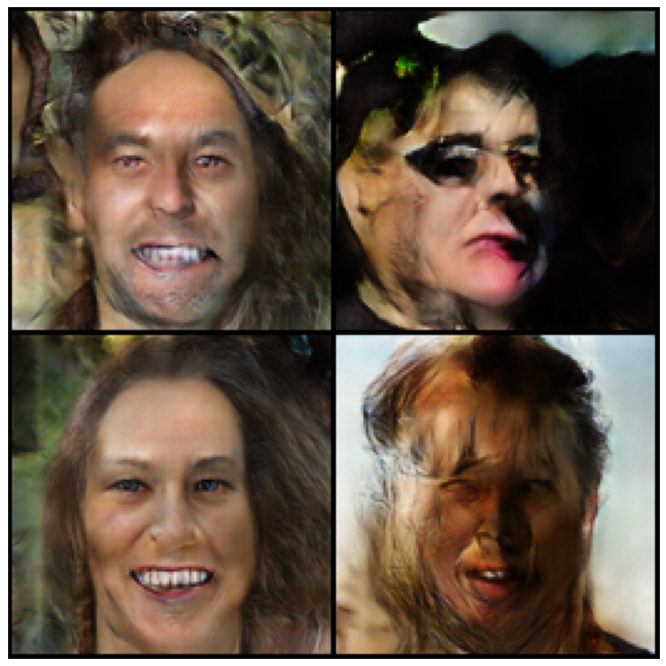

Epoch [10/10], loss_g: 5.8890, loss_d: 0.2216, real_score: 9.2111, fake_score: -5.1784


In [ ]:
history = fit(model, criterion, epochs, lr)

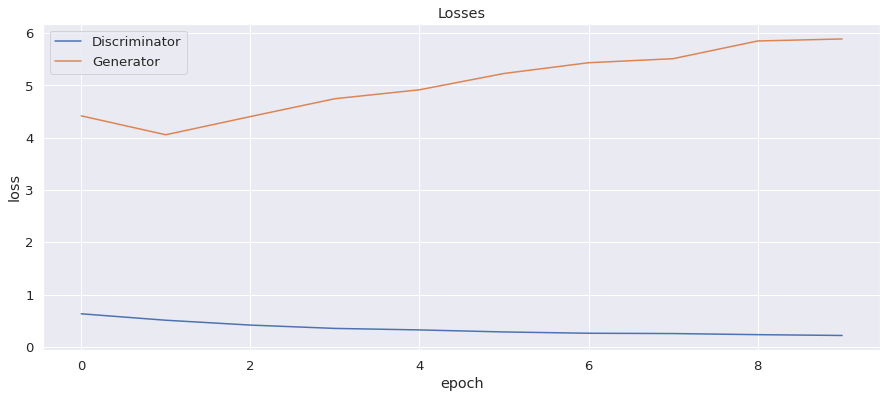

In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

plt.figure(figsize=(15, 6))
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

Поведение лоссов соответсвует ожиданиям. На первых эпохах генератору удается обманывать дискриминатора и лосс генератора падает. Потом дискриминатор начинает понимать разницу между фэйковыми и реальными картинками и лосс генератора неуклонно увеличивается.

## Часть 3. Генерация изображений (1 балл)

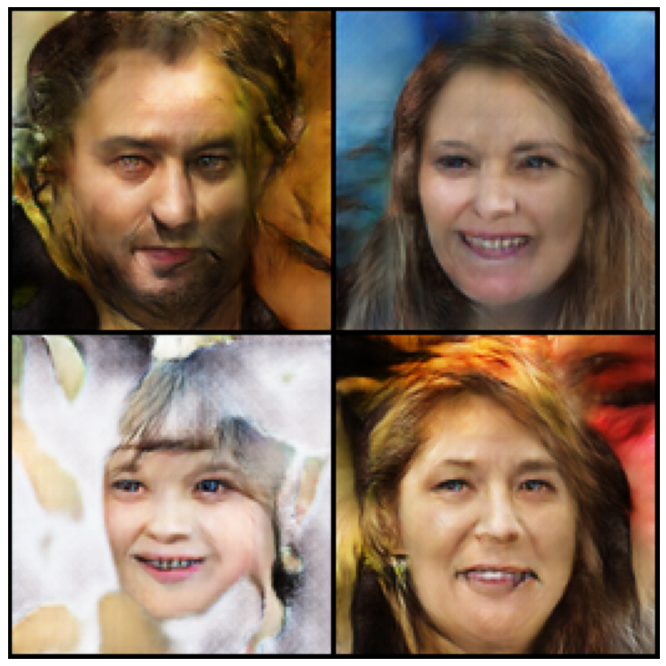

In [ ]:
model["generator"].eval()
with torch.no_grad():
    show_generated()

Как по мне, качество получившихся изображений достаточно хорошее. Однако стоит отметить, что 10 эпох обучения - это не предел и можно было бы обучать подольше, если бы не ограничения Colab. Еще хочется отметить - все изображения совершенно не похожи друг на друга, чего мы и добиваемся. К тому же лица(чего нельзя сказать о фоне) получились очень детализированными.

## Часть 4. Leave-one-out-1-NN classifier accuracy (6 баллов)

### 4.1. Подсчет accuracy (4 балла)

Не всегда бывает удобно оценивать качество сгенерированных картинок глазами. В качестве альтернативы вам предлагается реализовать следующий подход:
  * Сгенерировать столько же фейковых изображений, сколько есть настоящих в обучающей выборке. Присвоить фейковым метку класса 0, настоящим – 1.
  * Построить leave-one-out оценку: обучить 1NN Classifier (`sklearn.neighbors.KNeighborsClassifier(n_neighbors=1)`) предсказывать класс на всех объектах, кроме одного, проверить качество (accuracy) на оставшемся объекте. В этом вам поможет `sklearn.model_selection.LeaveOneOut`

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import LeaveOneOut, cross_val_score

In [ ]:
n_images = 1280
model['generator'].eval()
fake_images = []

with torch.no_grad():
    for i in range(20):
        xb = torch.randn(BATCH_SIZE, latent_size, 1, 1).to(DEVICE)
        fake_image = model['generator'](xb).detach().cpu().numpy()
        reshaped = fake_image.reshape(fake_image.shape[0], -1)
        fake_images.append(reshaped)

fake_images = np.vstack(fake_images)

len(fake_images), fake_images[0].shape

(320, (49152,))

In [ ]:
real_images = []
i = 0
for batch, _ in train_dl:
    if i == 20:
        break
    i += 1
    real_image = batch.detach().cpu().numpy()
    reshaped = real_image.reshape(real_image.shape[0], -1)
    real_images.append(reshaped)

real_images = np.vstack(real_images)

real_images[0].shape, len(real_images)

((49152,), 320)

In [ ]:
one_nn = KNeighborsClassifier(n_neighbors=1)

real_targets = np.ones(real_images.shape[0])
fake_targets = np.zeros(fake_images.shape[0])

X = np.concatenate((real_images, fake_images))
y = np.concatenate((real_targets, fake_targets))

In [ ]:
%time
scores = cross_val_score(one_nn, X, y, cv=LeaveOneOut())

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.39 µs


In [ ]:
scores.mean()

0.640625

Что вы можете сказать о получившемся результате? Какой accuracy мы хотели бы получить и почему?

Оптимальный accuracy был бы 0.5, так как именно в этом случае 1-NN classifier совсем не отличает реальные изображения от сгенерированных и как-будто подбрасывает монетку. Результат 0.64 хоть и не идеальный, но в целом соответствует ожидаемому. 

### 4.2. Визуализация распределений (2 балла)

Давайте посмотрим на то, насколько похожи распределения настоящих и фейковых изображений. Для этого воспользуйтесь методом, снижающим размерность (к примеру, TSNE) и изобразите на графике разным цветом точки, соответствующие реальным и сгенерированным изображенияи

In [ ]:
from sklearn.manifold import TSNE
import plotly.express as px

In [ ]:
X_embedded = TSNE(n_components=2).fit_transform(X)

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [ ]:
fig = px.scatter(X_embedded, x=0, y=1, color=y.astype(str), labels={'0':'x', '1': 'y'})
fig.show()

Из графика видно, что распределения реальных и фэйковых изображений приблизительно совпадают и похожи на гауссовское, что говорит о хорошем качестве обученного генератора.